# Генерация изображений в Stable Diffusion

Этот документ Google Colab позволит вам использовать нейросеть Stable Diffusion и другие аналогичные модели для генерации картинок по текстовому запросу (text-to-image) или по другому изображению (image-to-image). 

Обратите внимание, что необходимо прокликивать все испольняемые ячейки сверху вниз, поскольку следующие по тексту ячейки зависят от предыдущих.

### Часть 1: Предварительные установки

Для начала, установим необходимые библиотеки:

In [ ]:
!pip install -q diffusers
!pip install -q transformers scipy ftfy accelerate
!pip install -q "ipywidgets>=7,<8"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 737.4/737.4 KB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.2/199.2 KB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 51.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 KB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.8/212.8 KB 25.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 100.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 22.8 MB/s eta 0:00:00


Устанавливаем дополнительные библиотеки для ускорения работы:

In [ ]:
!pip install -q xformers
!pip install -q triton==2.0.0.dev20221120

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 MB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.7/18.7 MB 75.8 MB/s eta 0:00:00


### Часть 2: Регистрация на HuggingFace и получение ключа

Для использования моделей семейства Stable Diffusion вам нужно:

1. Зарегистрироваться на портале [HuggingFace.co](http://HuggingFace.co) и войти (Log In).
2. На страничке [Stable Diffusion](https://huggingface.co/CompVis/stable-diffusion-v1-4) согласиться с условиями использования. Кстати, эти условия [стоит прочитать](https://huggingface.co/spaces/CompVis/stable-diffusion-license).
3. На [своей страничке настроек](https://huggingface.co/settings/tokens) необходимо скопировать токен доступа (Access Token)

После этого прокликиваем ячейки ниже и вводим свой Access Token, когда попросят.


In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
from huggingface_hub import notebook_login

notebook_login()

Token is valid.
Your token has been saved in your configured git credential helpers (store).
Your token has been saved to /root/.cache/huggingface/token
Login successful


### Часть 3: Выбираем и загружаем модель Stable Diffusion

Существует множество моделей семейства Stable Diffusion, которые вы можете использовать. Выберите модель, которую вы хотите использоваться, и уберите значки комментария `#` в соответствующей строке.

In [ ]:

## По умолчанию используется оригинальная модель Stable Diffusion 1.4
model_name = "CompVis/stable-diffusion-v1-4"
use_fp16 = True

#### Классические модели Stable Diffusion
# Для моделей ниже желательно, чтобы переменная `use_fp16` была установлена
# в `True` - это сокращает время загрузки модели

# model_name = "runwayml/stable-diffusion-v1-5"
# model_name = "stabilityai/stable-diffusion-2"

#### Модели, обученные сообществом
# Как правило, для этих моделей необходимо использовать `use_fp16=False`
# Экспериментируйте с разными настройками, пока следующая ячейка не выполнится
# без ошибок

use_fp16 = False
# model_name = "andite/anything-v4.0"
# model_name = "stalkeryga/f222"
model_name = "prompthero/openjourney-v2"

Теперь собственно загружаем модель. Если при выполнении этой ячейки возникла ошибка - необходимо ещё раз проверить имя модели и значение переменной `use_fp16` выше.

> Использование `use_fp16=False` как правило является более надёжным вариантом.

In [ ]:
import torch
from diffusers import StableDiffusionPipeline

# make sure you're logged in with `huggingface-cli login`
if use_fp16:
  pipe = StableDiffusionPipeline.from_pretrained(model_name, revision="fp16", torch_dtype=torch.float16, use_auth_token=True)  
else:
  pipe = StableDiffusionPipeline.from_pretrained(model_name, torch_dtype=torch.float16, use_auth_token=True)  

pipe.enable_xformers_memory_efficient_attention()
pipe = pipe.to("cuda")

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

/usr/local/lib/python3.9/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


Далее определяем вспомогательную функцию для отображения нескольких изображений:

In [ ]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

### Часть 4: Пробуем генерировать изображения

Для генерации изображения, нам необходим текстовый запрос. Его можно указать ниже в переменной `prompt`. Можно также использовать негативный запрос `negative_prompt`.

Также можно задать высоту и ширину изображения - разумные установки содержатся ниже, можно выбрать между квадратом, портретным и горизонтальным режимом с помощью комментариев.

> Данный запрос сгенерирует три изображения по запросу - больше пробовать не стоит, т.к. скорее всего не хватит памяти GPU. Если вы увеличиваете размеры изображения, то скорее всего придётся уменьшить количество генерируемых изображений "за раз". В случае нехватки памяти вы получите ошибку *CUDA out of memory*, и придётся перезапускать google colab.

  0%|          | 0/50 [00:00<?, ?it/s]

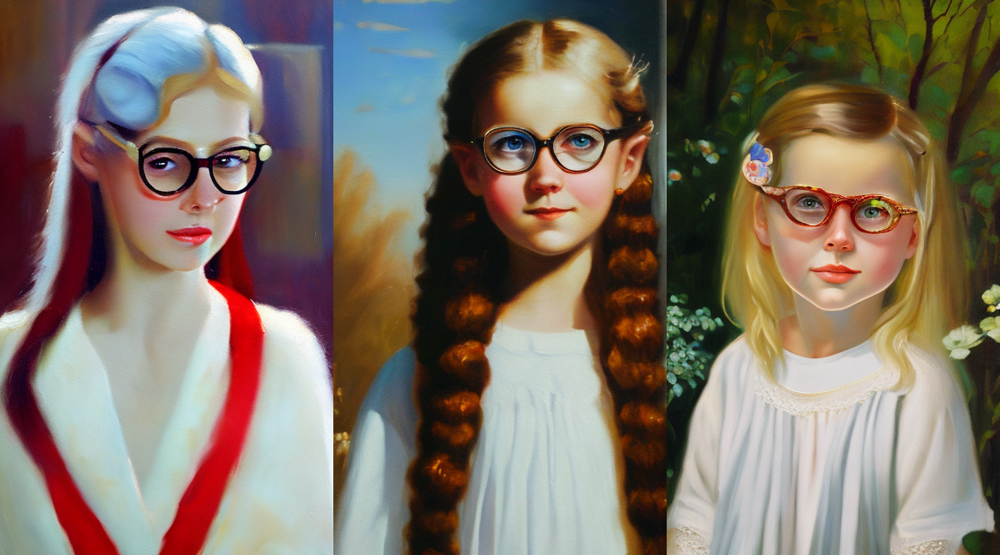

In [ ]:
prompt = "an oil painting of a beautiful white-hairder girl with glowing eyes, wearing glasses, looking with interest into the camera"
negative_prompt = "ugly, tiling, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"

# Число генерируемых изображений
num_images = 3

### Выбираем формат изображения. Размер должен быть кратен 8!
# Square
# height,width = 512,512

# Portrait
height,width = (16+64)*8, (16+32)*8

# Landscape
# height,width = (32+16)*8, (64+32)*8

### Другие параметры генерации
params = {
    "num_inference_steps" : 50, # число шагов генерации
    "guidance_scale" : 7.5 # насколько точно следовать запросу
}

with torch.autocast("cuda"):
  images = pipe([prompt]*num_images,
                negative_prompt=[negative_prompt]*num_images if negative_prompt else None,
                height=height,width=width,**params)["images"]

grid = image_grid(images, rows=1, cols=num_images)
grid

### Часть 5: Сохраняем результаты на диск Colab для скачивания

Мы можем сохранить результаты на диск Google Colab, и потом загрузить их единым архивом. Однако в случае, если произойдёт timeout из-за неактивности, а также после завершения работы сессии Colab, все сгенерированные результаты будут потеряны. Поэтому их необходимо своевременно скачивать!

Следующая ячейка сохраняет картинки. Можно генерировать и сохранять много картинок на диск, и потом уже выполнять следующие ячейки для их архивации.

In [ ]:
for i,im in enumerate(images):
   im.save(f"{prompt.replace(' ','_')}_{i}.png")

Следующая ячейка запаковывает все картинки в единый архив, который можно затем скачать. Также вы можете раскомментарить код, который удалит картинки после скачивания. После выполнения ячейки - зайдите в панель файлов и скачайте pics.zip к себе на компьютер.

In [ ]:
!zip pics.zip *.png

# Используйте следующую команду, если вы хотите удалить все файлы .png после 
# создания архива, чтобы начать следующую серию генераций "с нуля"
# !rm *.png

  adding: students_at_a_lecture_on_early_morning,_in_the_style_of_cubism_0.png (deflated 0%)
  adding: students_at_a_lecture_on_early_morning,_in_the_style_of_cubism_1.png (deflated 0%)
  adding: students_at_a_lecture_on_early_morning,_in_the_style_of_cubism_2.png (deflated 0%)


### Часть 6: Сохраняем результаты на Google Drive

Вы также можете подключить свой Google Drive, и сохранять результаты прямо туда. В этом случае они не будут потеряны в случае приостановки сессии Colab. Следующую ячейку с кодом для подключения необходимо выполнить только один раз. Впоследствии выполняйте только код для сохранения файлов.

In [ ]:
# Подключаем Google Drive

from google.colab import drive
!mkdir content
drive.mount('/content/drive')

# Создаём директорию для картинок
!mkdir /content/drive/MyDrive/NeuroArt

Следующая ячейка записывает файлы на Google Drive. Для генерации большого числа изображений выполняйте ячейку выше для генерации картинок, и затем эту ячейку для сохранения их на Google Drive

In [ ]:
for i,im in enumerate(images):
   im.save(f"drive/MyDrive/NeuroArt/{prompt.replace(' ','_')}_{i}.png")


### Часть 7: Генерируем много изображений сразу

Мы также можем сгенерировать сразу много изображений, комбинируя, например, разные стили. В этом коде `prompt` определяет основной запрос, а `style` - стилевую часть запроса. Формат изображения определяется переменными `height` и `width`. Символы `{}` в запросе заменяются на соответствующий стиль из `style`

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

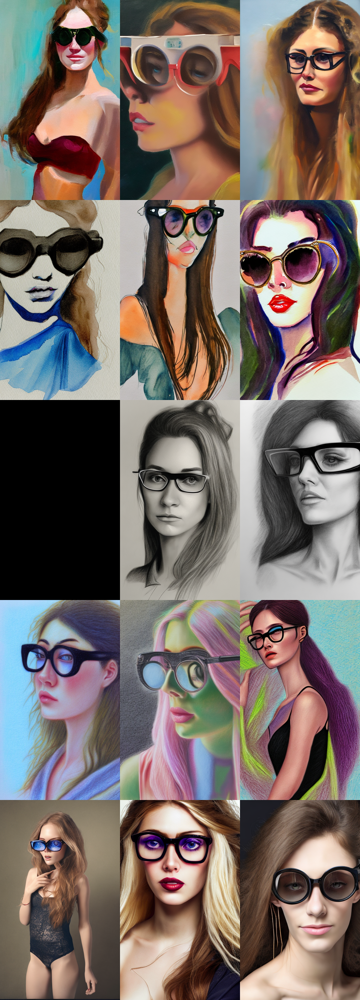

In [ ]:
style = ["oil painting","watercolor drawing","pencil sketch","pastel drawing",'hyper realistic photo']
prompt = "{} of a beautiful woman with circular glasses and long hair"

num_rows = len(style)
num_cols = 3

#height,width = 512,512 # square
height,width = (16+64)*8, (16+32)*8 # portrait
#height,width = (32+16)*8, (64+32)*8 # landscape

all_images = []
all_prompts = []
for i in range(num_rows):
  with torch.autocast("cuda"):
    xprompt = [prompt.format(style[i])]*num_cols
    images = pipe(xprompt,width=width,height=height)["images"]
  all_images.extend(images)
  all_prompts.extend(xprompt)

grid = image_grid(all_images, rows=num_rows, cols=num_cols)
grid

Сохраняем результаты (раскомментарьте строчку для Google Drive):

In [ ]:
for i,(img,p) in enumerate(zip(all_images,all_prompts)):
  img.save(f"{p.replace(' ','_')}_{i}.png") # Local Drive
  # img.save(f"drive/MyDrive/NeuroArt/{p.replace(' ','_')}_{i}.png") # Google Drive 

### Часть 8: SD2 Upscaler

Для увеличения размерности изображения можно использовать модель Stable Diffusion 2.1. В примере ниже мы генерируем изображение, и далее увеличиваем его в 4 раза. 

> Для того, чтобы хватило памяти GPU в Google Colab, мы также уменьшаем изображение вдвое перед увеличением.

In [ ]:
from diffusers import StableDiffusionUpscalePipeline
upscaler_model_id = "stabilityai/stable-diffusion-x4-upscaler"
upscaler = StableDiffusionUpscalePipeline.from_pretrained(upscaler_model_id, torch_dtype=torch.float16)
upscaler = upscaler.to("cuda")
upscaler.enable_attention_slicing()
upscaler.enable_xformers_memory_efficient_attention()


Fetching 14 files:   0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

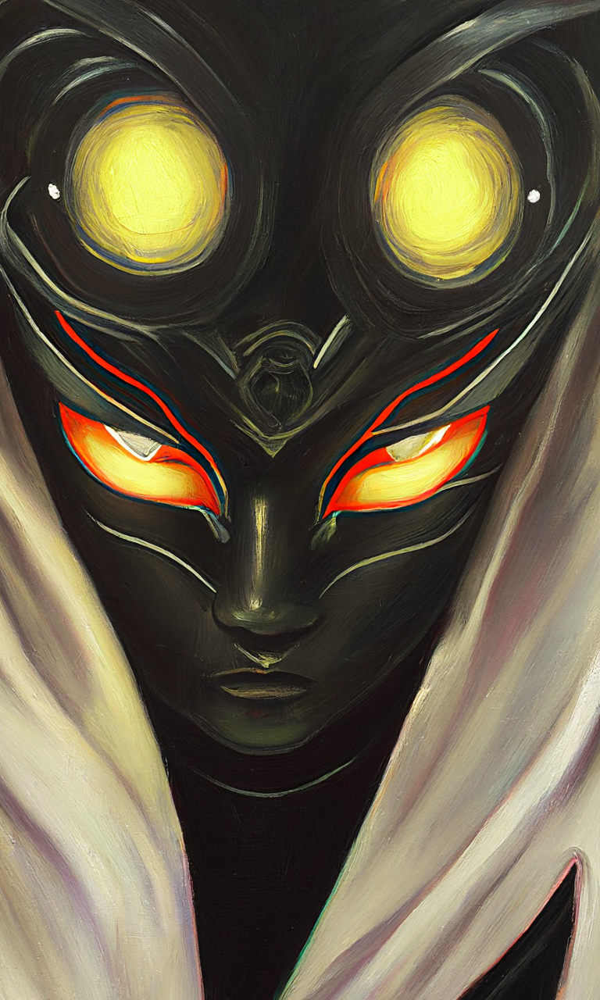

In [ ]:
prompt = "oil painting of a beautiful ninja woman with big glowing eyes, looking with attention into the camera"

img = pipe(prompt,width=width,height=height,**params)['images'][0]
img = img.resize((img.size[0]//2,img.size[1]//2),Image.LANCZOS)
img = upscaler(prompt,img).images[0]
img

Сохраняем результат:

In [ ]:
img.save('cool-result.jpg')

### Часть 9: Image-to-Image

Возможна генерация изображения по некоторому исходному рисунку. Для примера я воспользуюсь фотографией, хотя можно использовать и набросок рисунка "от руки". Файлы можно предварительно загрузить в Google Colab, или скачать из интернет по ссылке (для этого используйте ячейку ниже):

In [ ]:
!wget https://soshnikov.com/images/official/shwars_fall.jpg

--2023-03-17 11:02:29--  https://soshnikov.com/images/official/shwars_fall.jpg
Resolving soshnikov.com (soshnikov.com)... 185.199.108.153, 185.199.109.153
Connecting to soshnikov.com (soshnikov.com)|185.199.108.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 328416 (321K) [image/jpeg]
Saving to: ‘shwars_fall.jpg’

shwars_fall.jpg     100%[===================>] 320.72K  --.-KB/s    in 0.05s   

2023-03-17 11:02:30 (6.88 MB/s) - ‘shwars_fall.jpg’ saved [328416/328416]



Нам потребуется "забыть" предыдущие модели, чтобы освободить память в GPU для новой модели. Если вы захотите использовать `pipe` для генерации, или `upscaler` для повышения разрешения - вам придётся загрузить их заново

In [ ]:
pipe = None
upscaler = None

Теперь загружаем модель Image-2-Image. Имя модели используется то же, что и ранее для генерации изображений.

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline

if use_fp16:
  img2img = StableDiffusionImg2ImgPipeline.from_pretrained(model_name, revision="fp16", torch_dtype=torch.float16, use_auth_token=True)  
else:
  img2img = StableDiffusionImg2ImgPipeline.from_pretrained(model_name, torch_dtype=torch.float16, use_auth_token=True)  

img2img.enable_xformers_memory_efficient_attention()
img2img = img2img.to("cuda")


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

/usr/local/lib/python3.9/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


Теперь выполняем собственно генерацию Image-to-Image. Возможно, вам придётся немного уменьшить размер изображения, чтобы он был в районе 512 пикселей - в этом случае используйте строчку с resize (в противном случае её можно закомментарить с помощью `#`).

/usr/local/lib/python3.9/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:545: FutureWarning: You have passed 3 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/25 [00:00<?, ?it/s]

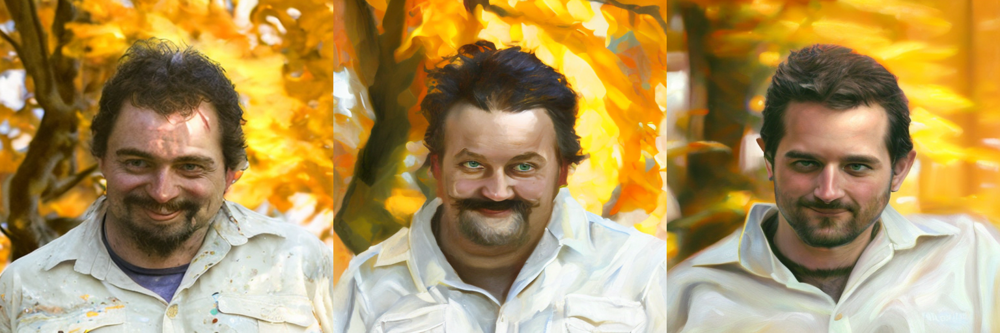

In [ ]:
# Загружаем исходную картинку
img = Image.open('shwars_fall.jpg')
prompt = "oil painting of a beautiful man"

# Изменяем размер картинки
img = img.resize((512,512),Image.LANCZOS)

# Число вариантов 
num_variants = 3

res = img2img(prompt=prompt,image=img, strength=0.5, num_images_per_prompt=num_variants)['images']
image_grid(res,rows=1,cols=num_variants)

Сохраняем результаты:

In [ ]:
for i,im in enumerate(res):
  im.save(f"{prompt.replace(' ','_')}_{i}.jpg")

### Часть 10: Преобразуем видео

Мы можем применить Style Transfer сразу ко многим кадрам видео, чтобы получить интересный эффект. В этом случае мы можем использовать утилиту `ffmpeg` для того, чтобы разбить видео на кадры, а потом склеить видео из преобразованных кадров.

Загрузим видео:

In [ ]:
!wget http://www.soshnikov.com/permanent/data/shwars.mp4

--2023-03-18 21:51:01--  http://www.soshnikov.com/permanent/data/shwars.mp4
Resolving www.soshnikov.com (www.soshnikov.com)... 79.137.227.122
Connecting to www.soshnikov.com (www.soshnikov.com)|79.137.227.122|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 878523 (858K) [text/plain]
Saving to: ‘shwars.mp4’

shwars.mp4          100%[===================>] 857.93K   196KB/s    in 5.0s    

2023-03-18 21:51:07 (170 KB/s) - ‘shwars.mp4’ saved [878523/878523]



Теперь разобьем видео на отдельные кадры с именами `frame000.png`, `frame001.png` и т.д.

In [ ]:
!ffmpeg -i shwars.mp4 frame%03d.png

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

Если размер кадра слишком большой - лучше привести его к чуть меньшему разрешению - для этого используем переменную `size`:

In [ ]:
size = (512,768)

from glob import glob

frames = [ Image.open(x).resize(size,Image.LANCZOS) for x in sorted(glob('frame*.png')) ]

Преобразуем все кадры с помощью Image2Image:

In [ ]:
prompt = "oil portrait of a man"

params = {
    "strength" : 0.4, # насколько сильно влияние входного изображения
    "num_inference_steps" : 40 # количество шагов преобразование (меньше шагов = ближе к исходному)
}

batch_size = 3
out = []
# height,width = size
#shape = (1, pipe.unet.in_channels, height // pipe.vae_scale_factor, width // pipe.vae_scale_factor)
#latents = torch.randn(shape,dtype=pipe.unet.dtype)
#latents = torch.stack([latents[0]]*batch_size)
# Dirty fix - if 1 frame is left in minibatch, it gives errors, so dup last frame
if len(frames)%batch_size==1:
  frames.append(frames[-1])
for i in range(0,len(frames),batch_size):
  res = img2img(prompt=[prompt]*batch_size,image=frames[i:i+batch_size],**params)
  out.extend(res.images)


Записываем результаты на диск:

In [ ]:
for i,im in enumerate(out):
  im.save(f"oframe_{i:03d}.png")

Собираем видео из кадров. Параметр `-r 10` задаёт логическое количество кадров в секунду (т.е. сколько кадров с диске будет показываться в секунду в итоговом видео), параметр `fps=25` - физическое количество кадров в секунду в итоговом видео. Эти параметры могут совпадать.

In [ ]:
!rm *.mp4
!ffmpeg -r 10 -i oframe_%03d.jpg -c:v libx264 -vf "fps=25,format=yuv420p" out.mp4


### Credits

Этот ноутбук был подготовлен [Дмитрием Сошниковым](http://soshnikov.com). Почитать поподробнее про нейрогенеративные модели вы можете [в моей заметке](https://soshnikov.com/scienceart/neural-generative-models-and-future-of-art-ru/), а посмотреть примеры - в онлайн-галерее [Experient.Art](http://experient.art).